# Cephalo inference in Colab

#### mbuehler@MIT.EDU 

lamm-mit/Cephalo-Phi-3-vision-128k-4b-beta

```bibtex
@article{Buehler_Cephalo_2024,
    title   = {Cephalo, a series of multi-modal vision-language models for bio-inspired materials and mechanics},
    author  = {M.J. Buehler},
    journal = {},
    year    = {2024},
    volume  = {},
    pages   = {},
    url     = {}
}
```

In [1]:
import os

!pip install transformers bitsandbytes accelerate
!pip install flash-attn --no-build-isolation

DEVICE='cuda'

import pandas as pd
from matplotlib import pyplot as plt
import pandas as pd

import torch
from transformers import AutoProcessor, BitsAndBytesConfig, AutoModelForCausalLM, AutoTokenizer

from datetime import datetime

import os
import random

from tqdm.notebook import tqdm
torch.__version__

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 119.8/119.8 MB 8.3 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 302.6/302.6 kB 31.8 MB/s eta 0:00:00
  Using cached nvidia_cuda_nvrtc_cu12-12.1.105-py3-none-manylinux1_x86_64.whl (23.7 MB)
  Using cached nvidia_cuda_runtime_cu12-12.1.105-py3-none-manylinux1_x86_64.whl (823 kB)
  Using cached nvidia_cuda_cupti_cu12-12.1.105-py3-none-manylinux1_x86_64.whl (14.1 MB)
  Using cached nvidia_cudnn_cu12-8.9.2.26-py3-none-manylinux1_x86_64.whl (731.7 MB)
  Using cached nvidia_cublas_cu12-12.1.3.1-py3-none-manylinux1_x86_64.whl (410.6 MB)
  Using cached nvidia_cufft_cu12-11.0.2.54-py3-none-manylinux1_x86_64.whl (121.6 MB)
  Using cached nvidia_curand_cu12-10.3.2.106-py3-none-manylinux1_x86_64.whl (56.5 MB)
  Using cached nvidia_cusolver_cu12-11.4.5.107-py3-none-manylinux1_x86_64.whl (124.2 MB)
  Using cached nvidia_cusparse_cu12-12.1.0.106-py3-none-manylinux1_x86_64.whl (196.0 MB)
  Using cached nvidia_nccl_cu12-2.20.5-py3-none-many

'2.3.0+cu121'

In [2]:
import random
import os
from pathlib import Path
from IPython.display import Markdown, display, display, Image
import random
import os
from pathlib import Path
from IPython.display import Markdown, display
import PIL.Image as Image_Pil
from transformers.image_utils import load_image

import requests
from PIL import Image as PILImage
from io import BytesIO

def rescale_to_max_dimension(image, max_dimension):
    original_width, original_height = image.size

    # Determine the scaling factor to resize the image
    scaling_factor = min(max_dimension / original_width, max_dimension / original_height)

    # Calculate the new dimensions while maintaining aspect ratio
    new_width = int(original_width * scaling_factor)
    new_height = int(original_height * scaling_factor)

    # Resize the image
    resized_image = image.resize((new_width, new_height), Image_Pil.Resampling.LANCZOS)
    return resized_image

def is_url(val) -> bool:
    return isinstance(val, str) and val.startswith("http")

def ensure_list(obj):
    if not isinstance(obj, list):
        return [obj]
    return obj

def ask_about_image (model, processor, question, images_input=[], verbatim=False, temperature=0.1, show_image=False,
                     system="You are a scientist who responds accurately.", init_instr = "",show_conversation=True,
                    max_new_tokens=256, messages=[], images=[], use_Markdown=False):

    query = question
    images_input=ensure_list(images_input)
    if len (images)==0:
        if len (images_input)>0:
            for image in tqdm (images_input) :
                if is_url(image):
                    image= load_image(image)
                images.append (image)

                if show_image:
                    display ( image )
    if len (messages)==0:

        image_messages = [f'<|image_{ii+1}|>' for ii, _ in enumerate (images_input)]
        image_messages = ''.join(image_messages)
        image_messages=image_messages+'\n'

        messages = [ {
                "role": "user",
                "content": f'{image_messages}'+system+init_instr+query},
                ]

    else:
        messages.append (
           {  "role": "user",
                "content": query},
             )
    if verbatim:
        print (messages)

    text = processor.tokenizer.apply_chat_template(messages, tokenize=False, add_generation_prompt=True)
    inputs = processor(text=text, images=images, return_tensors="pt", ).to(DEVICE)
    generation_args = {
                "max_new_tokens": max_new_tokens,
                "temperature": temperature,
                "do_sample": True,
                "stop_strings": ['<|end|>'],
                "tokenizer": processor.tokenizer,
            }

    generate_ids = model.generate(**inputs,
                                  **generation_args)
    generate_ids = generate_ids[:, inputs['input_ids'].shape[1]:]
    generated_texts = processor.batch_decode(generate_ids, skip_special_tokens=True, clean_up_tokenization_spaces=False)[0]



    messages.append ({  "role": "assistant",
                "content": generated_texts },)

    formatted_conversation = format_conversation(messages, images)

    # Display the formatted conversation in Jupyter Notebook
    if show_conversation:

        if use_Markdown:
            display(Markdown(formatted_conversation))
        else:
            display(HTML(formatted_conversation))

    return generated_texts, messages, images

import pandas as pd
from IPython.display import display, HTML, Markdown
import io
import base64

# Function to format the conversation
def format_conversation(convo, images=[]):
    formatted = ""

    for image_index, image in enumerate(images):
        if image_index == 0:  # Start of the image grid
            formatted += "<div style='display: grid; grid-template-columns: repeat(auto-fill, minmax(200px, 1fr)); gap: 10px;'>"
        img_str = pil_to_base64_str(image)
        formatted += f"<div><img src='data:image/png;base64,{img_str}' width='100%'/></div>"
        image_index += 1
        if image_index == len(images):  # End of the image grid
            formatted += "</div><br><br>"
    for entry in convo:
        role = entry['role']

        text = entry["content"].replace('\n', '<br>')
        formatted += f"<b>{role.capitalize()}:</b> {text}<br><br>"

    return formatted

# Function to convert PIL image to base64 string
def pil_to_base64_str(img):
    img_buffer = io.BytesIO()
    img.save(img_buffer, format='PNG')
    img_str = base64.b64encode(img_buffer.getvalue()).decode('utf-8')
    return img_str
def count_parameters(model):
    total_params = sum(p.numel() for p in model.parameters())
    trainable_params = sum(p.numel() for p in model.parameters() if p.requires_grad)
    return total_params/1e9, trainable_params/1e9

In [3]:
model_id='lamm-mit/Cephalo-Phi-3-vision-128k-4b-beta'
USE_QUANT=True

if USE_QUANT:
        bnb_config = BitsAndBytesConfig(
            load_in_4bit=True,
            bnb_4bit_quant_type="nf4",
            bnb_4bit_compute_dtype=torch.bfloat16
        )

model = AutoModelForCausalLM.from_pretrained( model_id, torch_dtype=torch.bfloat16,
                                              #_attn_implementation="flash_attention_2",
                                              quantization_config=bnb_config if USE_QUANT else None,
                                              trust_remote_code=True,
                                              device_map='auto',
                                            )

processor = AutoProcessor.from_pretrained(
    model_id,
    trust_remote_code=True,
)

/usr/local/lib/python3.10/dist-packages/huggingface_hub/utils/_token.py:89: UserWarning: 
The secret `HF_TOKEN` does not exist in your Colab secrets.
To authenticate with the Hugging Face Hub, create a token in your settings tab (https://huggingface.co/settings/tokens), set it as secret in your Google Colab and restart your session.
You will be able to reuse this secret in all of your notebooks.
Please note that authentication is recommended but still optional to access public models or datasets.
  warnings.warn(


config.json:   0%|          | 0.00/3.78k [00:00<?, ?B/s]

configuration_phi3_v.py:   0%|          | 0.00/10.6k [00:00<?, ?B/s]

A new version of the following files was downloaded from https://huggingface.co/microsoft/Phi-3-vision-128k-instruct:
- configuration_phi3_v.py
. Make sure to double-check they do not contain any added malicious code. To avoid downloading new versions of the code file, you can pin a revision.


modeling_phi3_v.py:   0%|          | 0.00/75.4k [00:00<?, ?B/s]

image_embedding_phi3_v.py:   0%|          | 0.00/14.1k [00:00<?, ?B/s]

A new version of the following files was downloaded from https://huggingface.co/microsoft/Phi-3-vision-128k-instruct:
- image_embedding_phi3_v.py
. Make sure to double-check they do not contain any added malicious code. To avoid downloading new versions of the code file, you can pin a revision.
A new version of the following files was downloaded from https://huggingface.co/microsoft/Phi-3-vision-128k-instruct:
- modeling_phi3_v.py
- image_embedding_phi3_v.py
. Make sure to double-check they do not contain any added malicious code. To avoid downloading new versions of the code file, you can pin a revision.


pytorch_model.bin.index.json:   0%|          | 0.00/69.0k [00:00<?, ?B/s]

pytorch_model-00001-of-00002.bin:   0%|          | 0.00/4.94G [00:00<?, ?B/s]

pytorch_model-00002-of-00002.bin:   0%|          | 0.00/3.35G [00:00<?, ?B/s]

Loading checkpoint shards:   0%|          | 0/2 [00:00<?, ?it/s]

generation_config.json:   0%|          | 0.00/141 [00:00<?, ?B/s]

preprocessor_config.json:   0%|          | 0.00/525 [00:00<?, ?B/s]

processing_phi3_v.py:   0%|          | 0.00/11.3k [00:00<?, ?B/s]

image_processing_phi3_v.py:   0%|          | 0.00/11.4k [00:00<?, ?B/s]

A new version of the following files was downloaded from https://huggingface.co/microsoft/Phi-3-vision-128k-instruct:
- image_processing_phi3_v.py
. Make sure to double-check they do not contain any added malicious code. To avoid downloading new versions of the code file, you can pin a revision.
A new version of the following files was downloaded from https://huggingface.co/microsoft/Phi-3-vision-128k-instruct:
- processing_phi3_v.py
- image_processing_phi3_v.py
. Make sure to double-check they do not contain any added malicious code. To avoid downloading new versions of the code file, you can pin a revision.


tokenizer_config.json:   0%|          | 0.00/9.44k [00:00<?, ?B/s]

tokenizer.json:   0%|          | 0.00/1.85M [00:00<?, ?B/s]

special_tokens_map.json:   0%|          | 0.00/670 [00:00<?, ?B/s]

Special tokens have been added in the vocabulary, make sure the associated word embeddings are fine-tuned or trained.


### Inference example

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

<div style='display: grid; grid-template-columns: repeat(auto-fill, minmax(200px, 1fr)); gap: 10px;'><div>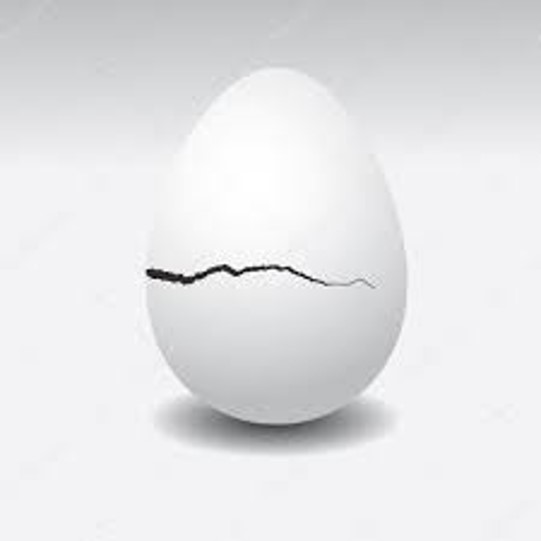</div></div><br><br><b>User:</b> <|image_1|><br>You are a materials scientist and you carefully analyze images, step by step.<br><br>Answer briefly. Do you detect a crack in the object?<br><br><b>Assistant:</b> Yes, there is a crack in the object.<br><br>

In [4]:
system="You are a materials scientist and you carefully analyze images, step by step.\n\n"
init_instr="Answer briefly. "
img_1='https://www.dropbox.com/scl/fi/wtqmjjixbsrhsaxuc7gwv/egg_crack.jpg?rlkey=bdjqjx2jvq1yx9gf387jd07oo&dl=1'
questions=["Do you detect a crack in the object?",]
temp_list=[0.1]*len (questions)

messages=[]
images=[]

for i, question in tqdm (enumerate (questions),total=len(questions)):
    if i==len (questions)-1:
        show_conversation=True
    else:
        show_conversation=False
    response, messages,images= ask_about_image (model, processor,  question,
                                         images_input=[img_1, ],
                                         temperature=temp_list[i],
                                         use_Markdown=True,
                                         system= system, init_instr=init_instr, show_conversation=show_conversation,
                                         max_new_tokens=512,messages=messages, images=images)

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

<div style='display: grid; grid-template-columns: repeat(auto-fill, minmax(200px, 1fr)); gap: 10px;'><div>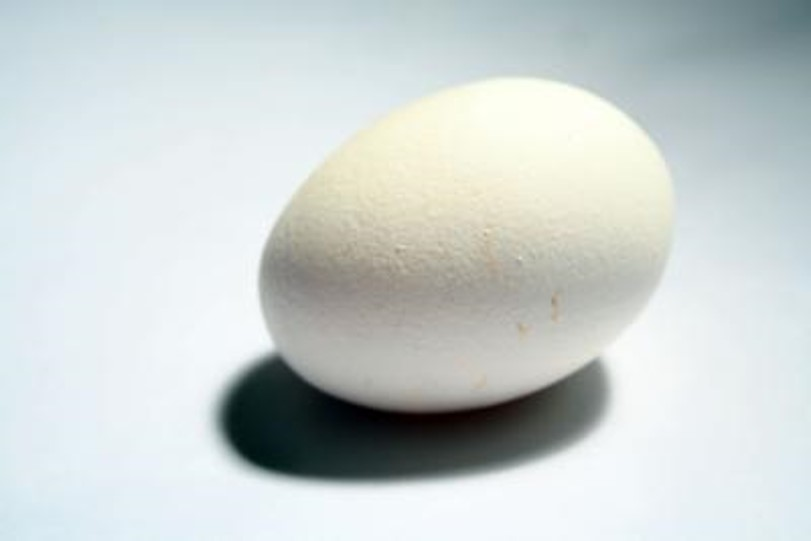</div></div><br><br><b>User:</b> <|image_1|><br>You are a materials scientist and you carefully analyze images, step by step.<br><br>Answer briefly. Do you detect a crack in the object?<br><br><b>Assistant:</b> No, there is no crack visible in the object.<br><br>

In [5]:
system="You are a materials scientist and you carefully analyze images, step by step.\n\n"
init_instr="Answer briefly. "
img_1='https://www.dropbox.com/scl/fi/1a6h3wwx59qktxagzf4xl/egg_nocrack.jpg?rlkey=0ysoyk2dg8vrvt4z280kiocp1&dl=1'

questions=["Do you detect a crack in the object?",
           ]
temp_list=[0.1]*len (questions)

messages=[]
images=[]

for i, question in tqdm (enumerate (questions),total=len(questions)):
    if i==len (questions)-1:
        show_conversation=True
    else:
        show_conversation=False
    response, messages,images= ask_about_image (model, processor,  question,
                                         images_input=[img_1, ],
                                         temperature=temp_list[i],
                                         use_Markdown=True,
                                         system= system, init_instr=init_instr, show_conversation=show_conversation,
                                         max_new_tokens=512,messages=messages, images=images)

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

<div style='display: grid; grid-template-columns: repeat(auto-fill, minmax(200px, 1fr)); gap: 10px;'><div>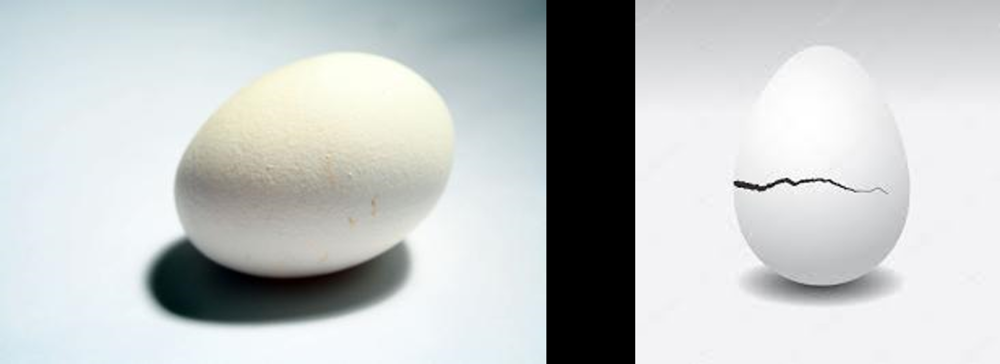</div></div><br><br><b>User:</b> <|image_1|><br>You are a materials scientist and you carefully analyze images, step by step.<br><br>Answer briefly. Carefully study this photo.<br><br>What do you see?<br><br><b>Assistant:</b> The image shows two eggs side by side. The egg on the left appears to be a standard, unmarked chicken egg, while the egg on the right has a cracked shell with a visible crack line. The crack is located on the right side of the egg, near the top. The background is plain and does not provide any additional context.<br><br><b>User:</b> How can the phenomenon be used to inform, or explain better materials?<br><br><b>Assistant:</b> The cracked eggshell can be used to inform materials science by studying the mechanics of crack propagation and the properties of the material that contribute to the crack's formation and growth. This can help in understanding how to design materials that are more resistant to cracking and how to improve the safety and reliability of materials in various applications.<br><br><b>User:</b> Provide a brief outlook to future research one could do.<br><br><b>Assistant:</b> Future research could focus on developing new materials with improved crack resistance and understanding the mechanisms of crack propagation. This could involve studying the properties of materials at the microscale and how they contribute to crack formation and growth. Additionally, research could explore the use of advanced imaging techniques to better understand the internal structure of materials and how it affects their mechanical properties.<br><br>

In [6]:
system="You are a materials scientist and you carefully analyze images, step by step.\n\n"
init_instr="Answer briefly. "
img_1='https://www.dropbox.com/scl/fi/j2ztwybxiotuwuuab9ibi/egg_cracks.png?rlkey=gh4fkczutruequ9bh8qg92hs2&dl=1'

questions=["Carefully study this photo.\n\nWhat do you see?",
'How can the phenomenon be used to inform, or explain better materials?',
'Provide a brief outlook to future research one could do.',
]
temp_list=[0.1]*len (questions)

messages=[]
images=[]

for i, question in tqdm (enumerate (questions),total=len(questions)):
    if i==len (questions)-1:
        show_conversation=True
    else:
        show_conversation=False
    response, messages,images= ask_about_image (model, processor,  question,
                                         images_input=[img_1, ],
                                         temperature=temp_list[i],
                                         use_Markdown=True,
                                         system= system, init_instr=init_instr, show_conversation=show_conversation,
                                         max_new_tokens=512,messages=messages, images=images)

### Pipeline V-LLM and image generation

In [7]:
from PIL import Image, ImageDraw, ImageFont

def assemble_grid_with_labels(im_list, prompt_list, grid_size=(3, 3), font_size=50, image_size=(100, 100), label_height=50, output_path='grid_output.png'):
    """
    Assembles a list of images with labels into a grid and saves as a PNG file.

    Parameters:
    - im_list: List of Pillow Image objects.
    - prompt_list: List of prompts corresponding to the images.
    - grid_size: Tuple indicating the grid size (rows, columns).
    - image_size: Tuple indicating the size of each image in the grid (width, height).
    - label_height: Height of the space reserved for labels.
    - output_path: Path to save the output PNG file.
    """
    # Calculate the size of the grid image
    grid_width = grid_size[1] * image_size[0]
    grid_height = grid_size[0] * (image_size[1] + label_height)

    # Create a new blank image with white background
    grid_image = Image.new('RGB', (grid_width, grid_height), 'white')

    # Load a font for the labels (using a default font)
    try:
        font = ImageFont.truetype("DejaVuSans.ttf", font_size)  # Use a font that is commonly available

    except IOError:
        font = ImageFont.load_default()

    except IOError:
        print ("Font error...")
        font = ImageFont.load_default()

    # Create a drawing context
    draw = ImageDraw.Draw(grid_image)

    # Paste each image and draw its label into the grid
    for index, (image, prompt) in enumerate(zip(im_list, prompt_list)):
        # Calculate the position to paste the image
        row = index // grid_size[1]
        col = index % grid_size[1]
        image_position = (col * image_size[0], row * (image_size[1] + label_height))

        # Resize the image to fit the grid cell
        resized_image = image.resize(image_size, Image.LANCZOS)

        # Paste the resized image into the grid
        grid_image.paste(resized_image, image_position)

        # Calculate the position for the label
        label_position = (image_position[0], image_position[1] + image_size[1])

        # Draw the label below the image with word wrap
        label_text = prompt
        max_width = image_size[0]
        wrapped_text = []
        words = label_text.split(' ')
        line = ''
        for word in words:
            if draw.textbbox((0, 0), line + word, font=font)[2] <= max_width:
                line += word + ' '
            else:
                wrapped_text.append(line)
                line = word + ' '
        wrapped_text.append(line)

        y_text = label_position[1]
        for line in wrapped_text:
            draw.text((label_position[0], y_text), line, fill="black", font=font)
            y_text += draw.textbbox((0, 0), line, font=font)[3]

    # Save the grid image as a PNG file

    display (grid_image)
    grid_image.save(output_path)


In [8]:
!pip install diffusers

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 2.2/2.2 MB 10.0 MB/s eta 0:00:00


In [9]:
from diffusers import AutoPipelineForText2Image
import torch

pipe = AutoPipelineForText2Image.from_pretrained("stabilityai/sdxl-turbo", torch_dtype=torch.float16, variant="fp16")
pipe.to("cuda:0")


model_index.json:   0%|          | 0.00/685 [00:00<?, ?B/s]

Fetching 18 files:   0%|          | 0/18 [00:00<?, ?it/s]

scheduler/scheduler_config.json:   0%|          | 0.00/459 [00:00<?, ?B/s]

text_encoder_2/config.json:   0%|          | 0.00/575 [00:00<?, ?B/s]

tokenizer/merges.txt:   0%|          | 0.00/525k [00:00<?, ?B/s]

text_encoder/config.json:   0%|          | 0.00/565 [00:00<?, ?B/s]

tokenizer/tokenizer_config.json:   0%|          | 0.00/704 [00:00<?, ?B/s]

tokenizer/special_tokens_map.json:   0%|          | 0.00/586 [00:00<?, ?B/s]

model.fp16.safetensors:   0%|          | 0.00/1.39G [00:00<?, ?B/s]

tokenizer/vocab.json:   0%|          | 0.00/1.06M [00:00<?, ?B/s]

model.fp16.safetensors:   0%|          | 0.00/246M [00:00<?, ?B/s]

tokenizer_2/special_tokens_map.json:   0%|          | 0.00/460 [00:00<?, ?B/s]

unet/config.json:   0%|          | 0.00/1.78k [00:00<?, ?B/s]

tokenizer_2/tokenizer_config.json:   0%|          | 0.00/855 [00:00<?, ?B/s]

vae/config.json:   0%|          | 0.00/607 [00:00<?, ?B/s]

diffusion_pytorch_model.fp16.safetensors:   0%|          | 0.00/5.14G [00:00<?, ?B/s]

diffusion_pytorch_model.fp16.safetensors:   0%|          | 0.00/167M [00:00<?, ?B/s]

Loading pipeline components...:   0%|          | 0/7 [00:00<?, ?it/s]

StableDiffusionXLPipeline {
  "_class_name": "StableDiffusionXLPipeline",
  "_diffusers_version": "0.28.0",
  "_name_or_path": "stabilityai/sdxl-turbo",
  "feature_extractor": [
    null,
    null
  ],
  "force_zeros_for_empty_prompt": true,
  "image_encoder": [
    null,
    null
  ],
  "scheduler": [
    "diffusers",
    "EulerAncestralDiscreteScheduler"
  ],
  "text_encoder": [
    "transformers",
    "CLIPTextModel"
  ],
  "text_encoder_2": [
    "transformers",
    "CLIPTextModelWithProjection"
  ],
  "tokenizer": [
    "transformers",
    "CLIPTokenizer"
  ],
  "tokenizer_2": [
    "transformers",
    "CLIPTokenizer"
  ],
  "unet": [
    "diffusers",
    "UNet2DConditionModel"
  ],
  "vae": [
    "diffusers",
    "AutoencoderKL"
  ]
}

### Generate images

In [10]:
target_dir='./output/'

# Create the directory if it does not exist
if not os.path.exists(target_dir):
    os.makedirs(target_dir)

# Verify the directory creation
os.path.exists(target_dir)

True

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]


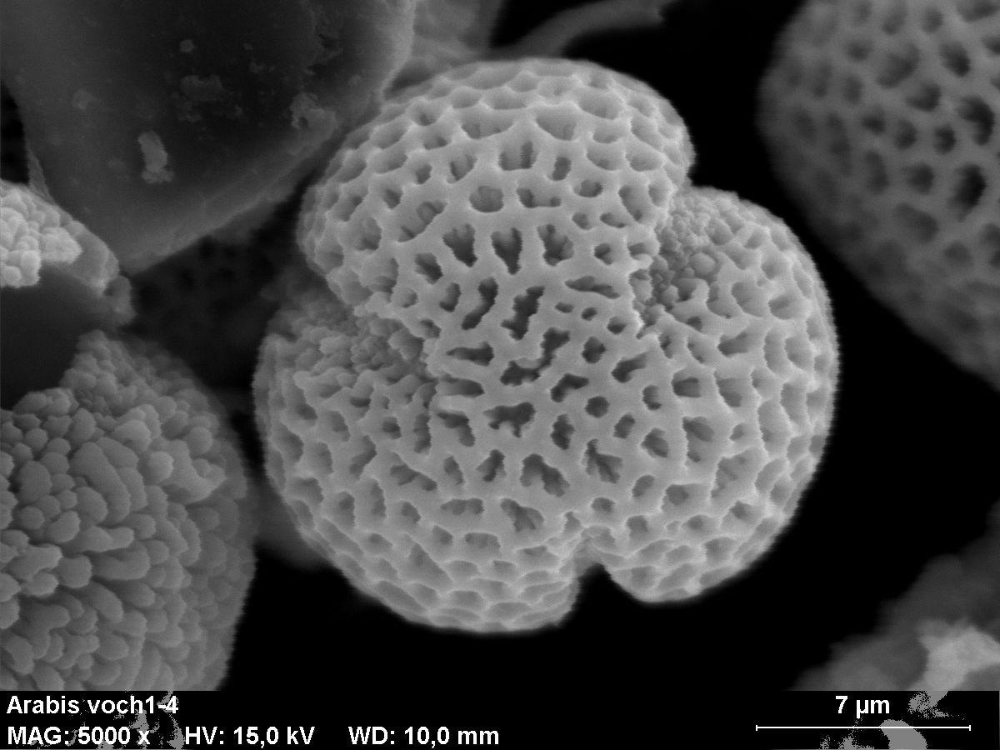

  0%|          | 0/2 [00:00<?, ?it/s]

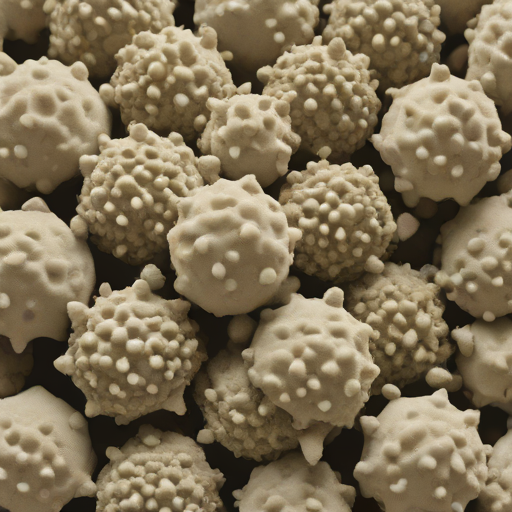

  0%|          | 0/4 [00:00<?, ?it/s]

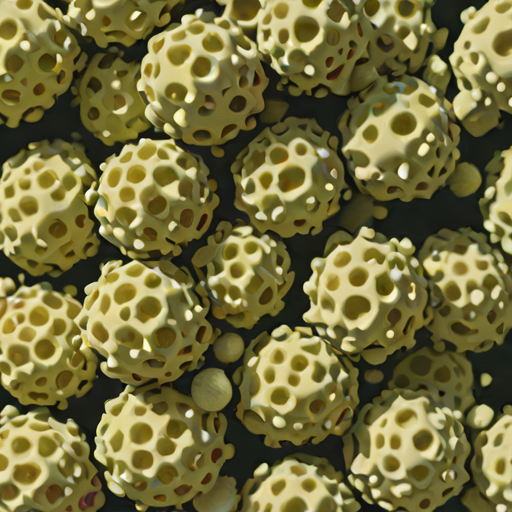

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]


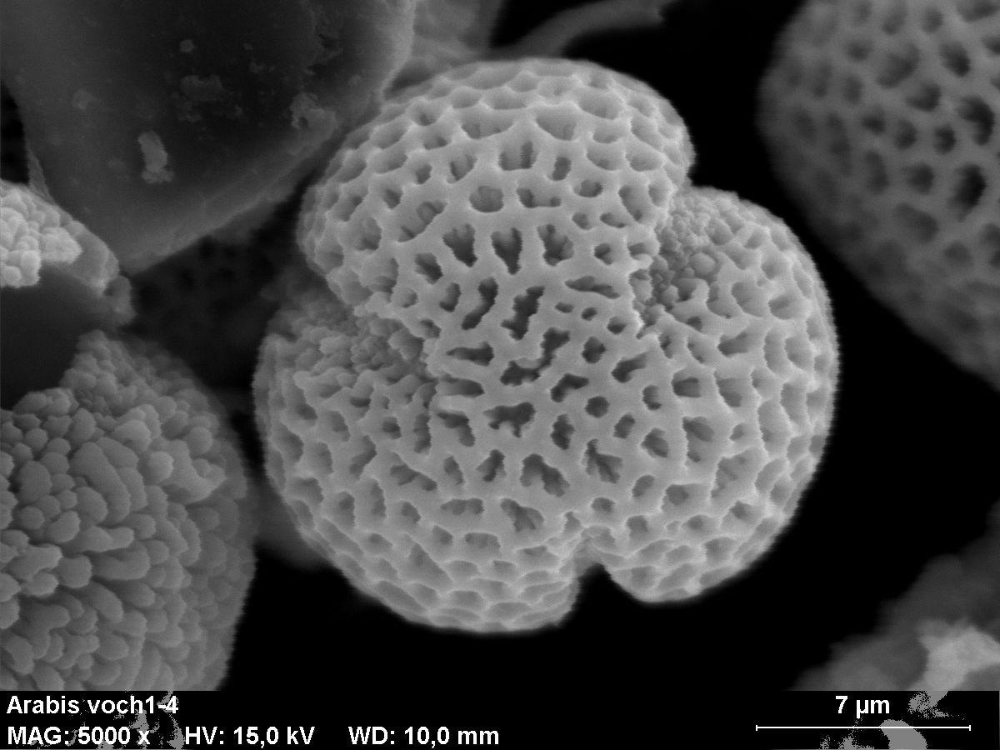

  0%|          | 0/2 [00:00<?, ?it/s]

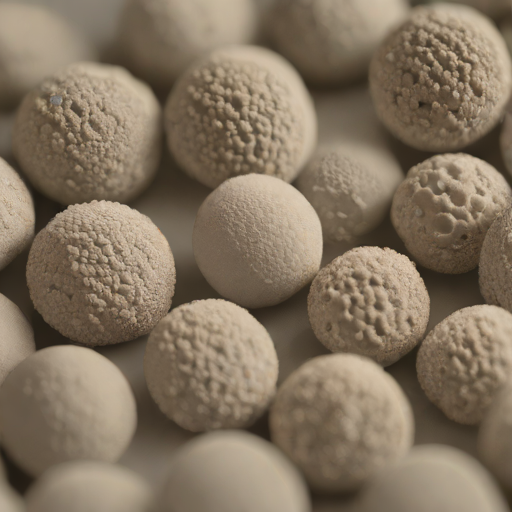

  0%|          | 0/4 [00:00<?, ?it/s]

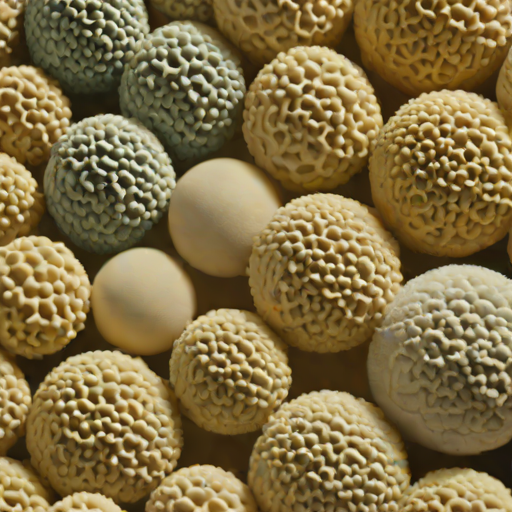

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]


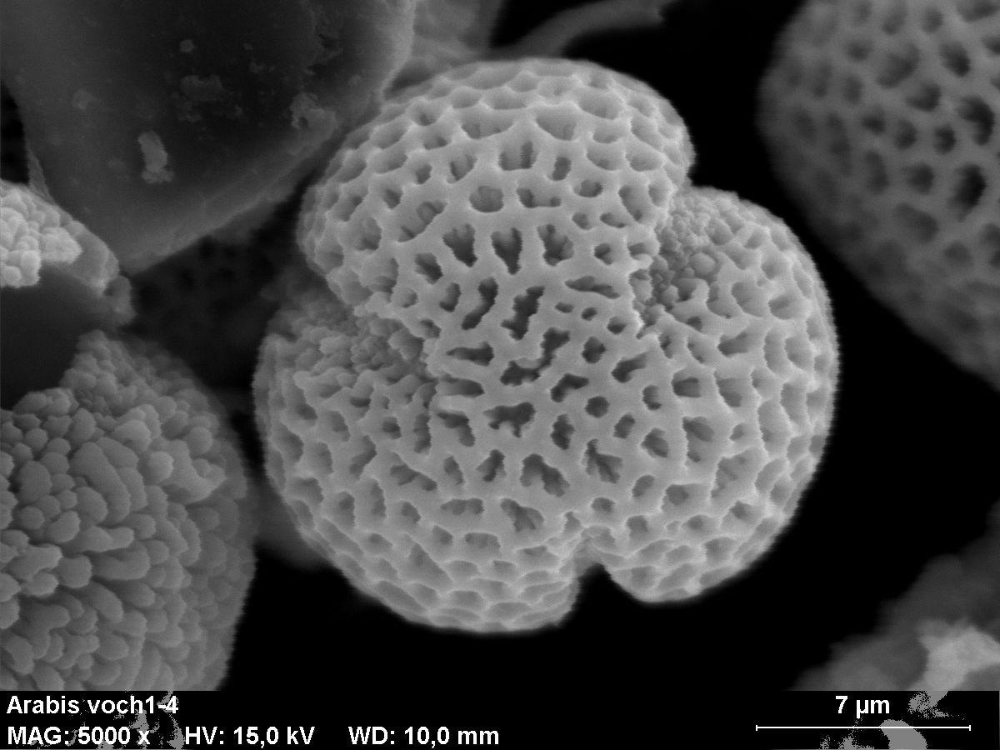

  0%|          | 0/2 [00:00<?, ?it/s]

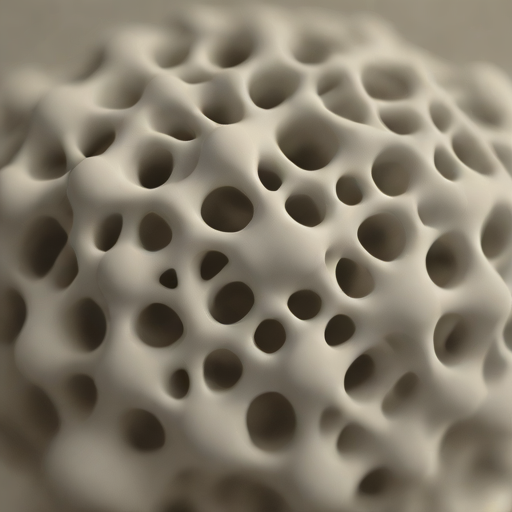

  0%|          | 0/4 [00:00<?, ?it/s]

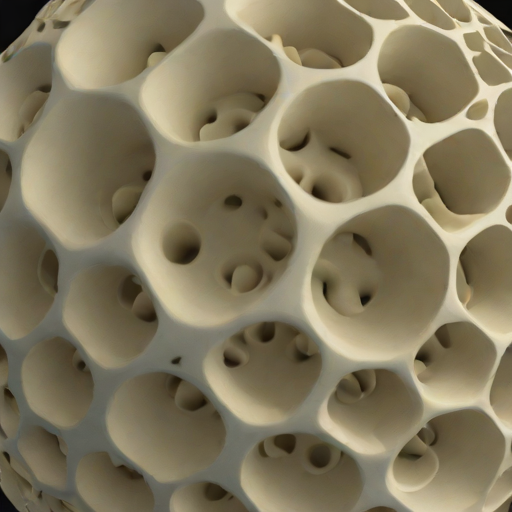

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]


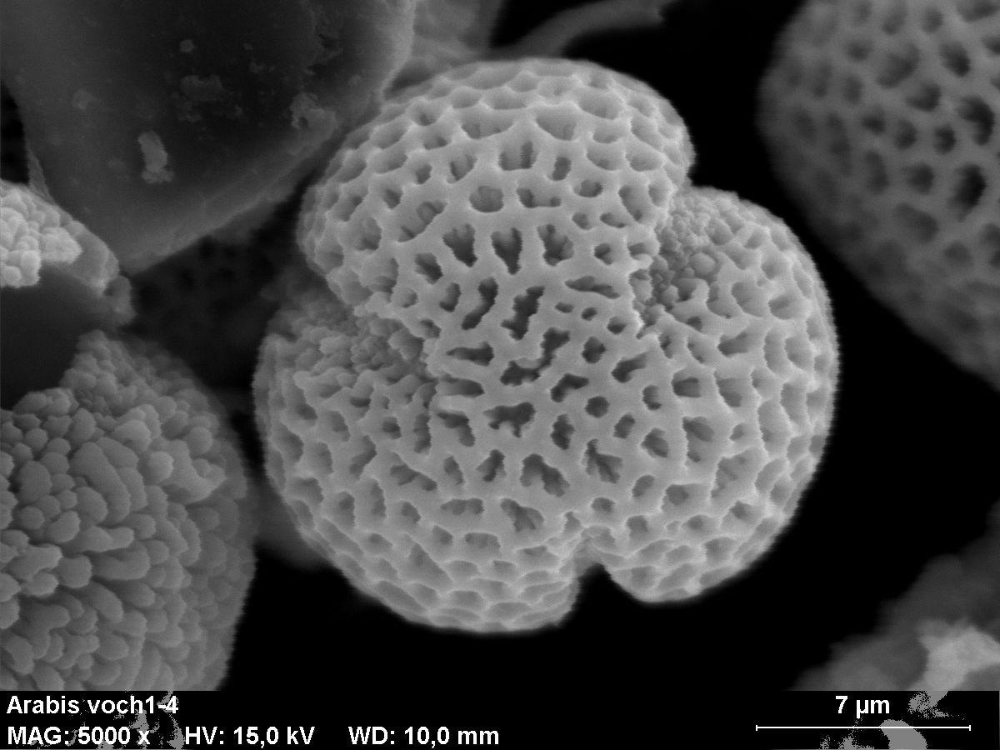

  0%|          | 0/2 [00:00<?, ?it/s]

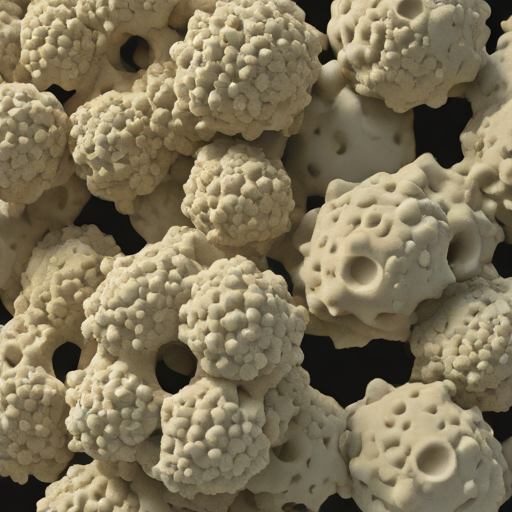

  0%|          | 0/4 [00:00<?, ?it/s]

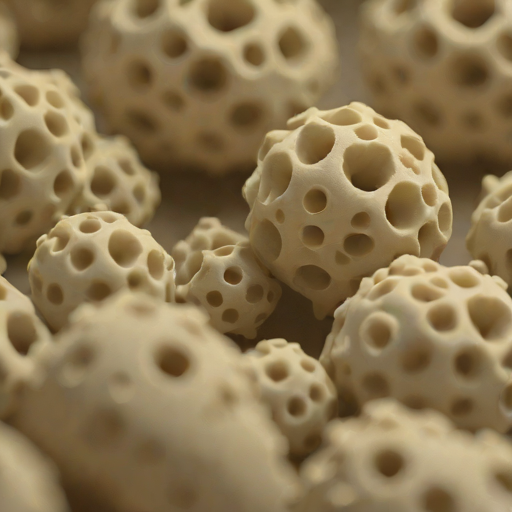

In [11]:
system=""
init_instr="Answer concisely, and accurately.\n\n"
img_1='https://www.dropbox.com/scl/fi/a2wj2jx2p3t8ikk5cbhu5/Arabis_voch1-4.jpg?rlkey=dbz1adzvhzyumgnnob7rqd8yb&dl=1'

questions=["Your task is to come up with an image generation prompt that uses concepts extracted from the cues in the image. \
The prompt must be brief, one sentence, but be a complete description of what the material looks like. \
I want to use the prompt for an image generation AI."]
temp_list=[0.1]*len (questions)

messages=[]
images=[]

im_list_0=[]
prompt_list_0=[]
im_list_1=[]
prompt_list_1=[]

N_trials=4

for iter in range (N_trials):

    messages=[]
    images=[]

    for i, question in tqdm (enumerate (questions),total=len(questions)):
        if i==len (questions)-1:
            show_conversation=True
        else:
            show_conversation=False
        response, messages,images= ask_about_image (model, processor,  question,
                                             images_input=[#PILImage.open(f'VALIDATION/{imgname_1}'),
                                                           img_1,],
                                             temperature=temp_list[i],
                                             system= system,
                                             init_instr=init_instr,
                                             show_conversation=show_conversation,
                                             max_new_tokens=512, messages=messages, images=images
                                                    )


    prompt = response

    image = pipe(prompt=prompt, num_inference_steps=2, guidance_scale=0.0).images[0]

    image.save(f"{target_dir}SDXL-turbo-{iter}-{prompt[:32]}_{datetime.now().strftime('%Y%m%d_%H%M%S')}.png")
    display (image)
    im_list_0.append (image)
    prompt_list_0.append (prompt)


    image = pipe(prompt=prompt, num_inference_steps=4, guidance_scale=0.0).images[0]

    image.save(f"{target_dir}SDXL-turbo-{iter}-{prompt[:32]}_{datetime.now().strftime('%Y%m%d_%H%M%S')}.png")
    display (image)
    im_list_1.append (image)
    prompt_list_1.append (prompt)


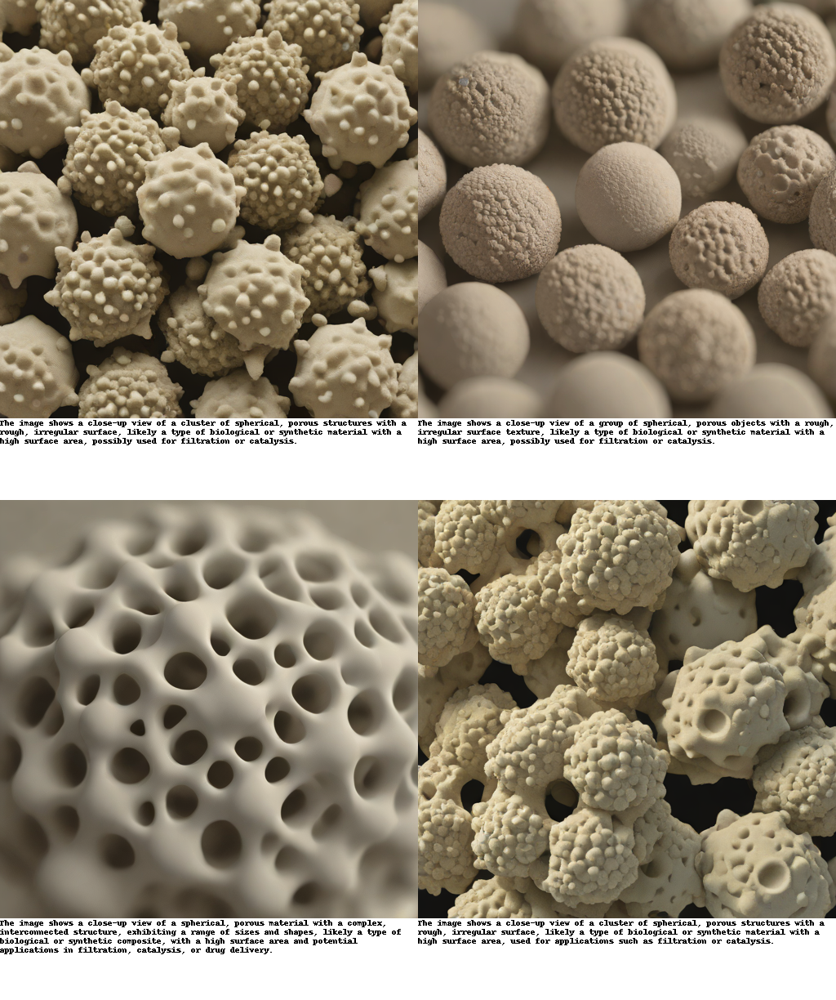

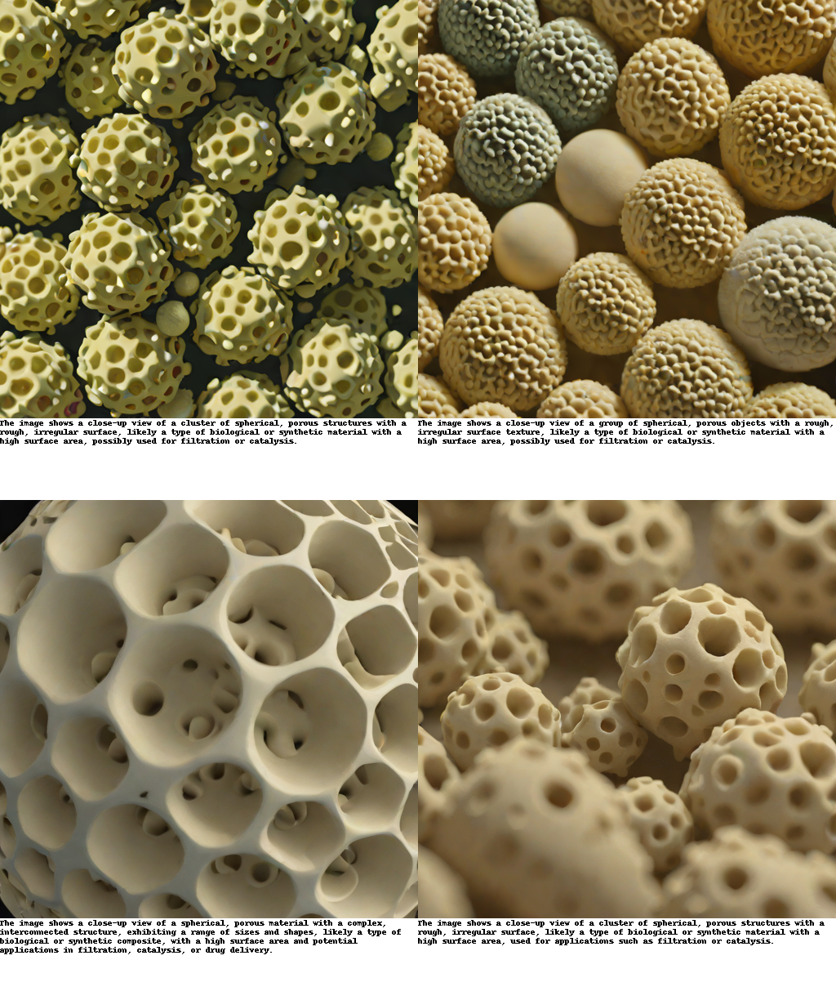

In [12]:
assemble_grid_with_labels(im_list_0, prompt_list_0, grid_size=(2, 2), image_size=(512, 512), font_size=16, label_height=100,
                          output_path=f"./{target_dir}/grid_output_0_{datetime.now().strftime('%Y%m%d_%H%M%S')}.png")
assemble_grid_with_labels(im_list_1, prompt_list_1, grid_size=(2, 2), image_size=(512, 512), font_size=16, label_height=100,
                          output_path=f"./{target_dir}/grid_output_{datetime.now().strftime('%Y%m%d_%H%M%S')}_1.png")